In [2]:
# imports required for analysis and plots
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import yaml

from IPython.display import Image, display, HTML # for image rendering in html output

In [3]:
# load the first dataset
# this one comes from the Office of Personnel Management (OPM)
# and is the Federal Employment Data (April 2026)
# https://data.opm.gov/explore-data/data/data-downloads
path1 = "employment_202604_1_2026-06-20.txt"

# this dataset has 64 columns and over 2 million rows!
# trim down to just columns that will be useful for analysis and visualizations
columns = [
    "age_bracket",
    "agency",
    "annualized_adjusted_basic_pay",
    "department",
    "duty_station_city",
    "duty_station_state",
    "education_level",
    "occupational_series",
    "supervisory_status",
    "tenure",
    "stem_occupation",
]

try:
    print(f"Loading dataset {path1}...")
    opm_df = pd.read_csv(path1, sep="|", usecols=columns)
    print("\tDataset loaded!")
except Exception as exception:
    print(f"ERROR: Unable to load dataset: {exception}")

opm_df.info()

Loading dataset employment_202604_1_2026-06-20.txt...
	Dataset loaded!
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2021167 entries, 0 to 2021166
Data columns (total 11 columns):
 #   Column                         Dtype 
---  ------                         ----- 
 0   age_bracket                    object
 1   agency                         object
 2   annualized_adjusted_basic_pay  object
 3   department                     object
 4   duty_station_city              object
 5   duty_station_state             object
 6   education_level                object
 7   occupational_series            object
 8   stem_occupation                object
 9   supervisory_status             object
 10  tenure                         object
dtypes: object(11)
memory usage: 169.6+ MB


In [5]:
# showcase data to get a feel for format
opm_df.head()

,age_bracket,agency,annualized_adjusted_basic_pay,department,duty_station_city,duty_station_state,education_level,occupational_series,stem_occupation,supervisory_status,tenure
0,45-49,DEPARTMENT OF HOMELAND SECURITY,158306,DEPARTMENT OF HOMELAND SECURITY,WASHINGTON,DISTRICT OF COLUMBIA,ASSOCIATE DEGREE,MANAGEMENT AND PROGRAM ANALYSIS,ALL OTHER OCCUPATIONS,ALL OTHER POSITIONS,TENURE GROUP 1 - CAREER OR SERVING AN APPOINTM...
1,55-59,DEPARTMENT OF HOMELAND SECURITY,REDACTED,DEPARTMENT OF HOMELAND SECURITY,REDACTED,REDACTED,BACHELOR'S DEGREE,"GENERAL INSPECTION, INVESTIGATION, ENFORCEMENT...",ALL OTHER OCCUPATIONS,SUPERVISOR OR MANAGER,TENURE GROUP 1 - CAREER OR SERVING AN APPOINTM...
2,65 OR MORE,DEPARTMENT OF HOMELAND SECURITY,104860,DEPARTMENT OF HOMELAND SECURITY,MIAMI,FLORIDA,HIGH SCHOOL GRADUATE OR CERTIFICATE OF EQUIVAL...,EMERGENCY MANAGEMENT SPECIALIST,ALL OTHER OCCUPATIONS,ALL OTHER POSITIONS,TENURE GROUP 3 - TAPER/TERM OR PROVISIONAL OR ...
3,40-44,DEPARTMENT OF JUSTICE,REDACTED,DEPARTMENT OF JUSTICE,REDACTED,REDACTED,HIGH SCHOOL GRADUATE OR CERTIFICATE OF EQUIVAL...,CRIMINAL INVESTIGATION,ALL OTHER OCCUPATIONS,ALL OTHER POSITIONS,TENURE GROUP 1 - CAREER OR SERVING AN APPOINTM...
4,40-44,DEPARTMENT OF JUSTICE,REDACTED,DEPARTMENT OF JUSTICE,REDACTED,REDACTED,MASTER'S DEGREE,CRIMINAL INVESTIGATION,ALL OTHER OCCUPATIONS,SUPERVISOR OR MANAGER,TENURE GROUP 1 - CAREER OR SERVING AN APPOINTM...


In [6]:
# load the second dataset
# this one comes College Scorecard
# https://collegescorecard.ed.gov/data/

# using data from 2024, the 2025 data is missing a lot of financial info
path2 = "College_Scorecard_Raw_Data_06102026/MERGED2024_25_PP.csv"
# the College Scorecard data also includes a data.yaml which contains useful metadata
yaml_path = "College_Scorecard_Raw_Data_06102026/data.yaml"
try:
    print(f"Loading yaml metdata {yaml_path}...")
    with open(yaml_path, 'r') as file:
        metadata = yaml.safe_load(file)
    print("\tMetadata loaded!")

    # this dataset has over 3000 columns, to speed up loading define the columns to keep in advance
    metrics = [
        'school.name',
        'school.state',
        'school.city',
        'school.ownership', # public, private, private non-profit
        'school.degrees_awarded.predominant', # primarily grants certificates, AS, or BS
        'cost.avg_net_price.public', # average cost of attendance after grants/scholarships
        'cost.avg_net_price.private', # average cost of attendance after grants/scholarships
        'admissions.admission_rate.overall',
        'student.size'
    ]

    # use the metadata to specify dtypes for more efficient loading
    dictionary = metadata["dictionary"]
    dtype = {}
    columns = []
    for key in metrics:
        print(key)
        columns.append(dictionary[key]["source"])
        if "type" in dictionary[key]:
            if "integer" == dictionary[key]["type"]:
                dtype[key] = "int64"
            elif "float" == dictionary[key]["type"]:
                dtype[key] = "float64"
                
    print(f"Loading dataset {path2}...")
    scorecard_df = pd.read_csv(path2, usecols=columns)
    print("\tDataset loaded!")
except Exception as exception:
    print(f"ERROR: Unable to load dataset: {exception}")

scorecard_df.info()

Loading yaml metdata College_Scorecard_Raw_Data_06102026/data.yaml...
	Metadata loaded!
school.name
school.state
school.city
school.ownership
school.degrees_awarded.predominant
cost.avg_net_price.public
cost.avg_net_price.private
admissions.admission_rate.overall
student.size
Loading dataset College_Scorecard_Raw_Data_06102026/MERGED2024_25_PP.csv...
	Dataset loaded!
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6322 entries, 0 to 6321
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   INSTNM     6322 non-null   object 
 1   CITY       6322 non-null   object 
 2   STABBR     6322 non-null   object 
 3   PREDDEG    6322 non-null   int64  
 4   CONTROL    6322 non-null   int64  
 5   ADM_RATE   1927 non-null   float64
 6   UGDS       5587 non-null   float64
 7   NPT4_PUB   1800 non-null   float64
 8   NPT4_PRIV  3313 non-null   float64
dtypes: float64(4), int64(2), object(3)
memory usage: 444.6+ KB


In [7]:
# display first few rows to get a feel for format
scorecard_df.head()

,INSTNM,CITY,STABBR,PREDDEG,CONTROL,ADM_RATE,UGDS,NPT4_PUB,NPT4_PRIV
0,Alabama A & M University,Normal,AL,3,1,0.5795,6124.0,17621.0,NaN
1,University of Alabama at Birmingham,Birmingham,AL,3,1,0.8818,11635.0,18749.0,NaN
2,Amridge University,Montgomery,AL,3,2,NaN,241.0,NaN,NaN
3,University of Alabama in Huntsville,Huntsville,AL,3,1,0.6857,6591.0,18796.0,NaN
4,Alabama State University,Montgomery,AL,3,1,0.9755,3477.0,20435.0,NaN


In [8]:
# now we can work on combining the data by joining on State
# since we want to combine, first remove rows where State has been REDACTED by OPM
rows = opm_df[opm_df["duty_station_state"] == "REDACTED"].index
opm_df.drop(rows, inplace=True)

# we can see from .info() that we are down to ~1 million rows
opm_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1063893 entries, 0 to 2021166
Data columns (total 11 columns):
 #   Column                         Non-Null Count    Dtype 
---  ------                         --------------    ----- 
 0   age_bracket                    1063893 non-null  object
 1   agency                         1063893 non-null  object
 2   annualized_adjusted_basic_pay  1036942 non-null  object
 3   department                     1063893 non-null  object
 4   duty_station_city              1059322 non-null  object
 5   duty_station_state             1063893 non-null  object
 6   education_level                1063893 non-null  object
 7   occupational_series            1063893 non-null  object
 8   stem_occupation                1063893 non-null  object
 9   supervisory_status             1063893 non-null  object
 10  tenure                         1063893 non-null  object
dtypes: object(11)
memory usage: 97.4+ MB


In [9]:
# opm_df uses the full state name and scorecard_df uses the state abbreviation,
# we need to modify one df so they are consistent

state_map = {
    'ALABAMA': 'AL', 'ALASKA': 'AK', 'ARIZONA': 'AZ', 'ARKANSAS': 'AR',
    'CALIFORNIA': 'CA', 'COLORADO': 'CO', 'CONNECTICUT': 'CT', 'DELAWARE': 'DE',
    'FLORIDA': 'FL', 'GEORGIA': 'GA', 'HAWAII': 'HI', 'IDAHO': 'ID',
    'ILLINOIS': 'IL', 'INDIANA': 'IN', 'IOWA': 'IA', 'KANSAS': 'KS',
    'KENTUCKY': 'KY', 'LOUISIANA': 'LA', 'MAINE': 'ME', 'MARYLAND': 'MD',
    'MASSACHUSETTS': 'MA', 'MICHIGAN': 'MI', 'MINNESOTA': 'MN', 'MISSISSIPPI': 'MS',
    'MISSOURI': 'MO', 'MONTANA': 'MT', 'NEBRASKA': 'NE', 'NEVADA': 'NV',
    'NEW HAMPSHIRE': 'NH', 'NEW JERSEY': 'NJ', 'NEW MEXICO': 'NM', 'NEW YORK': 'NY',
    'NORTH CAROLINA': 'NC', 'NORTH DAKOTA': 'ND', 'OHIO': 'OH', 'OKLAHOMA': 'OK',
    'OREGON': 'OR', 'PENNSYLVANIA': 'PA', 'RHODE ISLAND': 'RI', 'SOUTH CAROLINA': 'SC',
    'SOUTH DAKOTA': 'SD', 'TENNESSEE': 'TN', 'TEXAS': 'TX', 'UTAH': 'UT',
    'VERMONT': 'VT', 'VIRGINIA': 'VA', 'WASHINGTON': 'WA', 'WEST VIRGINIA': 'WV',
    'WISCONSIN': 'WI', 'WYOMING': 'WY', 'DISTRICT OF COLUMBIA': 'DC'
}

# add state abbreviation column to opm_df
opm_df['duty_station_state_abbr'] = opm_df['duty_station_state'].map(state_map)
opm_df['duty_station_state_abbr'].head()

0    DC
2    FL
5    DC
6    LA
7    PA
Name: duty_station_state_abbr, dtype: object

In [10]:
# because we are going to combine on State, must aggregate our desired metrics to avoid an explosion
# of rows due to many schools and employees in each State

# convert salary to numeric first
opm_df['annualized_adjusted_basic_pay'] = pd.to_numeric(opm_df['annualized_adjusted_basic_pay'], errors='coerce')

# aggregate values and group
opm_summary = opm_df.groupby(['duty_station_state_abbr', 'age_bracket', 'department', 
                              'education_level', 'stem_occupation']).agg(
    employee_count=('annualized_adjusted_basic_pay', 'size'),
    mean_salary=('annualized_adjusted_basic_pay', 'mean')
).reset_index()
opm_summary.head()

,duty_station_state_abbr,age_bracket,department,education_level,stem_occupation,employee_count,mean_salary
0,AK,20-24,DEPARTMENT OF AGRICULTURE,BACHELOR'S DEGREE,ALL OTHER OCCUPATIONS,4,47764.75
1,AK,20-24,DEPARTMENT OF AGRICULTURE,HIGH SCHOOL GRADUATE OR CERTIFICATE OF EQUIVAL...,ALL OTHER OCCUPATIONS,5,54856.00
2,AK,20-24,DEPARTMENT OF AGRICULTURE,TWO YEARS COLLEGE,ALL OTHER OCCUPATIONS,1,61874.00
3,AK,20-24,DEPARTMENT OF COMMERCE,BACHELOR'S DEGREE,STEM OCCUPATIONS,10,58676.20
4,AK,20-24,DEPARTMENT OF COMMERCE,MASTER'S DEGREE,STEM OCCUPATIONS,1,69789.00


In [11]:
# now work on summarizing the scorecard_df

# remap types of schools for readability
control_map = {1: 'Public', 2: 'Private', 3: 'Private'}
scorecard_df['CONTROL_TYPE'] = scorecard_df['CONTROL'].map(control_map)

# make it easier to tell public vs private
scorecard_df['is_public'] = (scorecard_df['CONTROL'] == 1)
scorecard_df['is_private'] = (scorecard_df['CONTROL'].isin([2, 3]))

# new columns to make aggregating easier
# .where() keeps the value if the condition is True, otherwise sets to NaN
scorecard_df['adm_rate_public'] = scorecard_df['ADM_RATE'].where(scorecard_df['is_public'])
scorecard_df['adm_rate_private'] = scorecard_df['ADM_RATE'].where(scorecard_df['is_private'])
scorecard_df['cost_public'] = scorecard_df['NPT4_PUB'].where(scorecard_df['is_public'])
scorecard_df['cost_private'] = scorecard_df['NPT4_PRIV'].where(scorecard_df['is_private'])
scorecard_df['size_public'] = scorecard_df['UGDS'].where(scorecard_df['is_public'])
scorecard_df['size_private'] = scorecard_df['UGDS'].where(scorecard_df['is_private'])

# aggregate!
scorecard_summary = scorecard_df.groupby('STABBR').agg(
    public_count=('is_public', 'sum'),
    private_count=('is_private', 'sum'),
    avg_adm_rate_public=('adm_rate_public', 'mean'),
    avg_adm_rate_private=('adm_rate_private', 'mean'),
    avg_pub_cost=('cost_public', 'mean'),
    avg_priv_cost=('cost_private', 'mean'),
    avg_size_public=('size_public', 'mean'),
    avg_size_private=('size_private', 'mean')
).reset_index()
scorecard_summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59 entries, 0 to 58
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   STABBR                59 non-null     object 
 1   public_count          59 non-null     int64  
 2   private_count         59 non-null     int64  
 3   avg_adm_rate_public   53 non-null     float64
 4   avg_adm_rate_private  53 non-null     float64
 5   avg_pub_cost          59 non-null     float64
 6   avg_priv_cost         53 non-null     float64
 7   avg_size_public       59 non-null     float64
 8   avg_size_private      53 non-null     float64
dtypes: float64(6), int64(2), object(1)
memory usage: 4.3+ KB


In [12]:
# we can now finally merge the two datasets on State!
combined_df = pd.merge(
    opm_summary, 
    scorecard_summary, 
    left_on='duty_station_state_abbr', 
    right_on='STABBR', 
    how='inner'
)

# drop the redundant state column after the merge
combined_df = combined_df.drop(columns=['STABBR'])

# result has 97.8k rows 15 columns
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97800 entries, 0 to 97799
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   duty_station_state_abbr  97800 non-null  object 
 1   age_bracket              97800 non-null  object 
 2   department               97800 non-null  object 
 3   education_level          97800 non-null  object 
 4   stem_occupation          97800 non-null  object 
 5   employee_count           97800 non-null  int64  
 6   mean_salary              95732 non-null  float64
 7   public_count             97800 non-null  int64  
 8   private_count            97800 non-null  int64  
 9   avg_adm_rate_public      89385 non-null  float64
 10  avg_adm_rate_private     97800 non-null  float64
 11  avg_pub_cost             97800 non-null  float64
 12  avg_priv_cost            97800 non-null  float64
 13  avg_size_public          97800 non-null  float64
 14  avg_size_private      

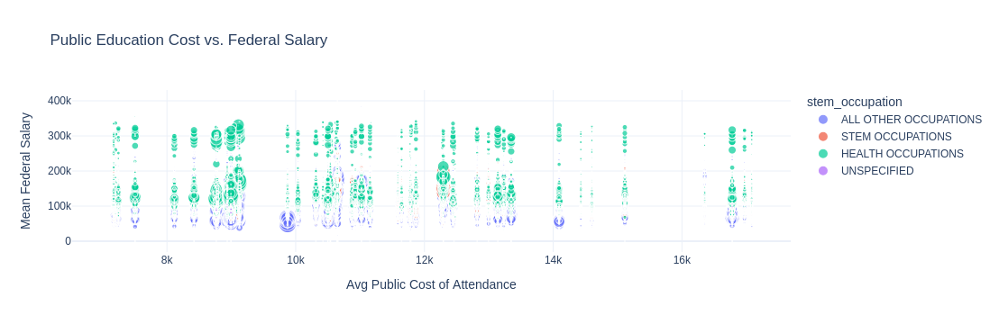

In [13]:
# now let's begin exploratory data analysis!
# plotting some combinations of things that may be interesting just to find an insight to focus on

# create a scatterplot
fig = px.scatter(
    combined_df, 
    x='avg_pub_cost', 
    y='mean_salary', 
    color='stem_occupation', 
    size='employee_count',
    hover_data=['duty_station_state_abbr', 'department'],
    title='Public Education Cost vs. Federal Salary'
)
fig.update_layout(
    xaxis_title="Avg Public Cost of Attendance",
    yaxis_title="Mean Federal Salary",
    template="plotly_white"
)
fig.show()

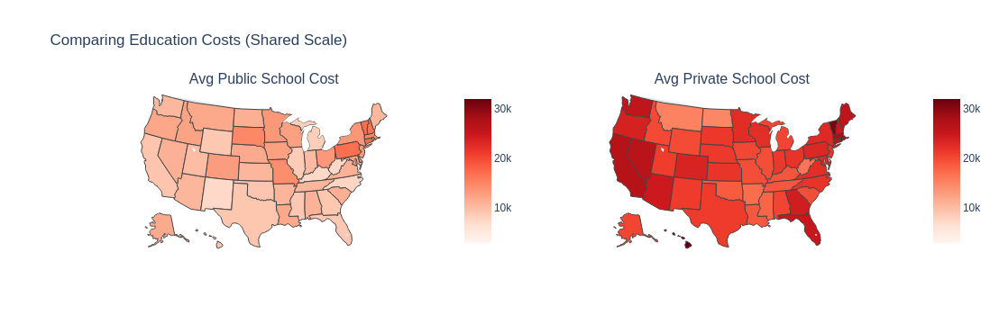

In [14]:
# compare private and public costs
zmin = min(scorecard_summary['avg_pub_cost'].min(), scorecard_summary['avg_priv_cost'].min())
zmax = max(scorecard_summary['avg_pub_cost'].max(), scorecard_summary['avg_priv_cost'].max())

fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Avg Public School Cost", "Avg Private School Cost"),
    specs=[[{"type": "choropleth"}, {"type": "choropleth"}]]
)

fig.add_trace(
    go.Choropleth(
        locations=scorecard_summary['STABBR'],
        z=scorecard_summary['avg_pub_cost'],
        zmin=zmin, zmax=zmax,
        locationmode="USA-states",
        colorscale="Reds",
        colorbar=dict(x=0.45)
    ),
    row=1, col=1
)

fig.add_trace(
    go.Choropleth(
        locations=scorecard_summary['STABBR'],
        z=scorecard_summary['avg_priv_cost'],
        zmin=zmin, zmax=zmax,
        locationmode="USA-states",
        colorscale="Reds", 
        colorbar=dict(x=1.0)
    ),
    row=1, col=2
)

fig.update_layout(
    geo=dict(scope='usa'),
    geo2=dict(scope='usa'),
    title_text="Comparing Education Costs (Shared Scale)"
)

fig.show()

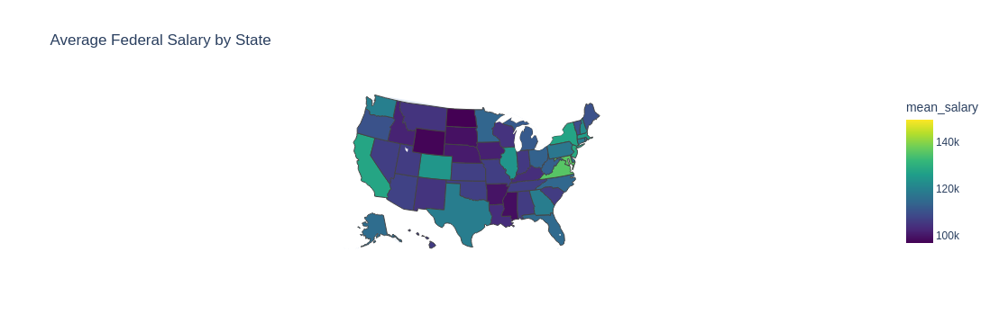

In [15]:
# federal salaries by state
state_salary_map = combined_df.groupby('duty_station_state_abbr')['mean_salary'].mean().reset_index()
fig = px.choropleth(
    state_salary_map, 
    locations='duty_station_state_abbr', 
    locationmode="USA-states", 
    color='mean_salary', 
    scope="usa",
    color_continuous_scale="Viridis",
    title="Average Federal Salary by State"
)
fig.show()

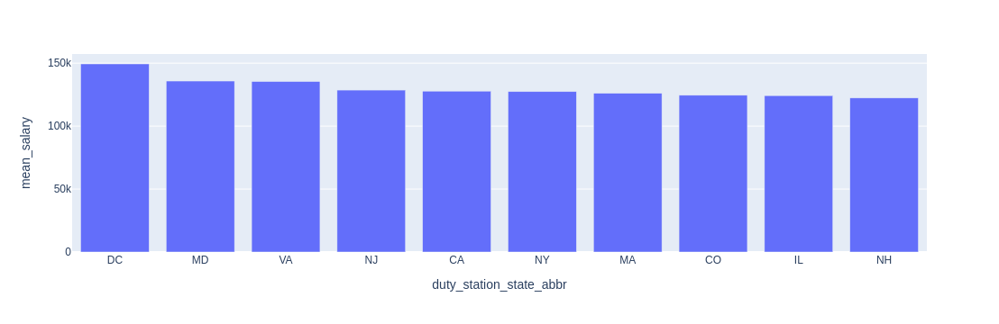

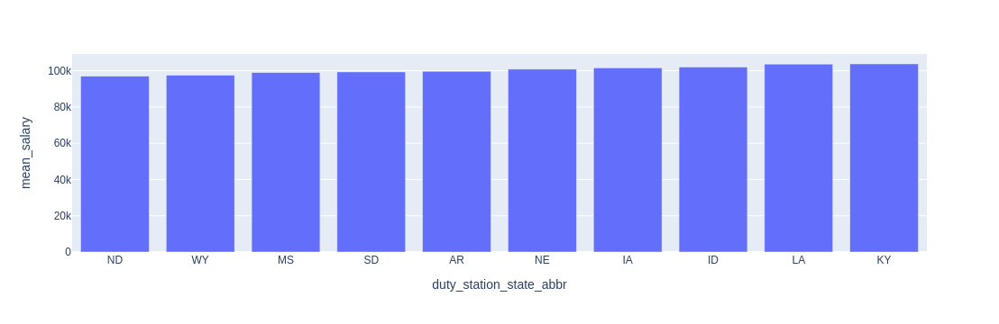

In [16]:
# best and worst paying states
plot_df = combined_df.groupby('duty_station_state_abbr').agg({
    'mean_salary': 'mean',
    'avg_pub_cost': 'mean' # Or however your cost column is named
}).reset_index()

top_10_states = plot_df.sort_values('mean_salary', ascending=False).head(10)

bottom_10_states = plot_df.sort_values('mean_salary', ascending=True).head(10)

fig = px.bar(top_10_states, x='duty_station_state_abbr', y='mean_salary')
fig.show()

fig = px.bar(bottom_10_states, x='duty_station_state_abbr', y='mean_salary')
fig.show()

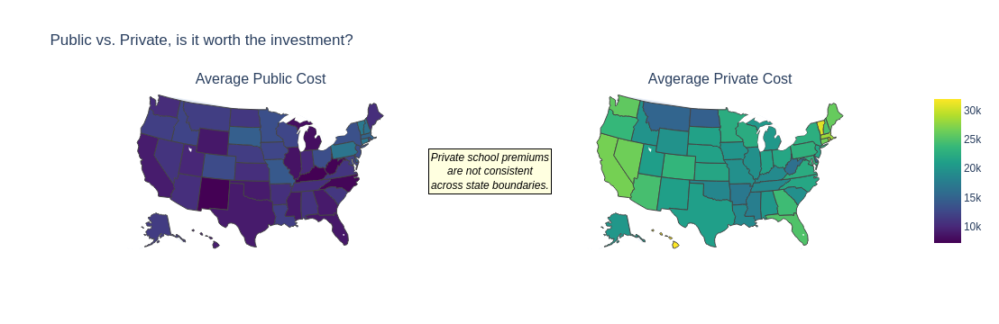

In [20]:
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Average Public Cost", "Avgerage Private Cost"),
    specs=[[{"type": "choropleth"}, {"type": "choropleth"}]]
)

# define a shared color scale range
z_min = min(state_roi['avg_pub_cost'].min(), state_roi['avg_priv_cost'].min())
z_max = max(state_roi['avg_pub_cost'].max(), state_roi['avg_priv_cost'].max())

# public map
fig.add_trace(go.Choropleth(
    locations=state_roi['STABBR'], z=state_roi['avg_pub_cost'],
    locationmode="USA-states", colorscale="Viridis", zmin=z_min, zmax=z_max,
    showscale=False
), row=1, col=1)
# private map
fig.add_trace(go.Choropleth(
    locations=state_roi['STABBR'], z=state_roi['avg_priv_cost'],
    locationmode="USA-states", colorscale="Viridis", zmin=z_min, zmax=z_max,
    showscale=True
), row=1, col=2)

# layout
fig.update_layout(
    geo=dict(scope='usa'),
    geo2=dict(scope='usa'),
    title_text="Public vs. Private, is it worth the investment?"
)

# add note to convey insight
fig.add_annotation(
    x=0.5, y=0.5,
    text="<i>Private school premiums<br>are not consistent<br>across state boundaries.</i>",
    showarrow=False,
    font=dict(size=12, color="black"),
    bgcolor="lightyellow",
    bordercolor="black",
    borderwidth=1,
    xref="paper", yref="paper"
)

fig.show()

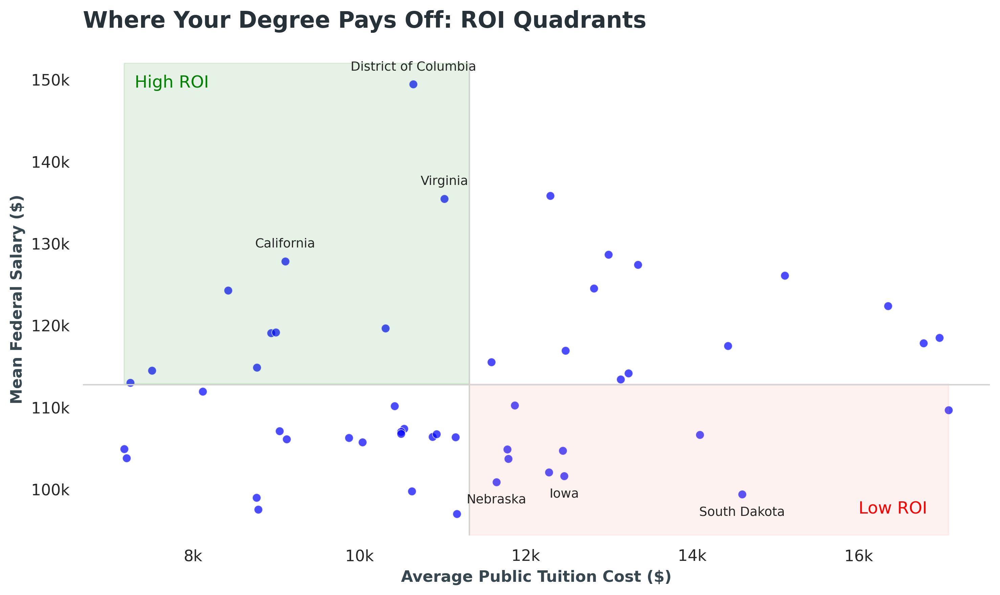

In [21]:
# now begin explanatory analysis!

# the two groups of stakeholders will be prospective students and federal hiring managers

# viz #1 shows which states have the best and worst ROI (salary against public tuition cost)
# although this will probably be the last chart in the narrative
state_roi = combined_df.groupby('duty_station_state_abbr')['mean_salary'].mean().reset_index()
state_roi = pd.merge(
    state_roi, 
    scorecard_summary, 
    left_on='duty_station_state_abbr', 
    right_on='STABBR', 
    how='inner'
)

# calulate averages to build quadrants
mean_cost = state_roi['avg_pub_cost'].mean()
mean_salary = state_roi['mean_salary'].mean()

# set up the figure size and style
plt.figure(figsize=(10, 6))
sns.set_style("white")

# base plot
sns.scatterplot(
    data=state_roi, 
    x='avg_pub_cost', 
    y='mean_salary', 
    color='blue', 
    alpha=0.7
)

# use average values to divide into quadrants
plt.axvline(x=mean_cost, color='lightgray', linestyle='-', linewidth=1)
plt.axhline(y=mean_salary, color='lightgray', linestyle='-', linewidth=1)

# color the two quadrants for better interpretation
# High ROI (Low Cost, High Salary)
plt.axvspan(state_roi['avg_pub_cost'].min(), mean_cost, 
            ymin=0.32, ymax=1, color='green', alpha=0.1)
# Low ROI (High Cost, Low Salary)
plt.axvspan(mean_cost, state_roi['avg_pub_cost'].max(), 
            ymin=0, ymax=0.32, color='salmon', alpha=0.1)

# quadrant labels to make it even more clear
plt.text(7300, 149000, "High ROI", color="green")
plt.text(16000, 97000, "Low ROI", color="red")


# i manually determined the top and bottom 3 states, add labels
high_labels = {
    'DC': 'District of Columbia',
    'VA': 'Virginia',
    'CA': 'California'
}
low_labels = {
    'SD': 'South Dakota',
    'NE': 'Nebraska',
    'IA': 'Iowa'
} 
for key, value in high_labels.items():
    row = state_roi[state_roi['STABBR'] == key]
    plt.annotate(value, (row['avg_pub_cost'].values[0], row['mean_salary'].values[0]),
                 xytext=(0, 10), textcoords='offset points', ha='center', fontsize=9)
for key, value in low_labels.items():
    row = state_roi[state_roi['STABBR'] == key]
    plt.annotate(value, (row['avg_pub_cost'].values[0], row['mean_salary'].values[0]),
                 xytext=(0, -15), textcoords='offset points', ha='center', fontsize=9)

# format large numbers
ax = plt.gca()
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{int(x/1000)}k'))
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{int(x/1000)}k'))

# final formatting
plt.title("Where Your Degree Pays Off: ROI Quadrants", fontsize=16, fontweight='bold', color='#263238', pad=25, loc='left')
plt.xlabel("Average Public Tuition Cost ($)", fontsize=11, fontweight='bold', color='#37474F')
plt.ylabel("Mean Federal Salary ($)", fontsize=11, fontweight='bold', color='#37474F')
sns.despine(left=True, bottom=True) # Removes top and right borders for a cleaner look

# save and display!
plt.tight_layout()
image_name = "where_your_degree_pays_off"
plt.savefig(f"output/{image_name}.png", dpi=300, bbox_inches='tight')
plt.close()
display(Image(filename=f"output/{image_name}.png"))

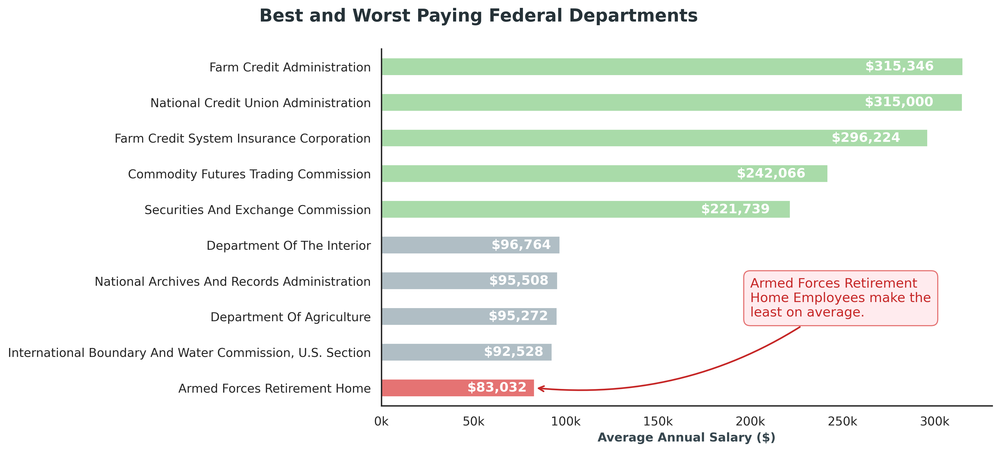

In [22]:
# viz #2 best and worst departments to work for

# get data
dept_avg_salary = combined_df.groupby('department')['mean_salary'].mean().sort_values()
top_5 = dept_avg_salary.tail(5)
bottom_5 = dept_avg_salary.head(6).tail(5) # last department is just N/A so ignore it
plot_data = pd.concat([bottom_5, top_5])
plot_data.index = [name.title() for name in plot_data.index]

# bar colors, red, grey, green
colors = ['#E57373'] + ['#B0BEC5'] * 4 + ['#A9DBA9'] * 5

# base plot
sns.set_theme(style="white")
fig, ax = plt.subplots(figsize=(10, 6))

# format dollars in thousands (100k)
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{int(x/1000)}k'))

plot_data.plot(kind='barh', color=colors, ax=ax, edgecolor='white')

# aesthetics
sns.despine(left=False, bottom=False)
ax.set_title("Best and Worst Paying Federal Departments", fontsize=16, fontweight='bold', color='#263238', pad=25, loc='left', x=-0.2)
ax.set_xlabel("Average Annual Salary ($)", fontsize=11, fontweight='bold', color='#37474F')
ax.set_ylabel("")

# add dollar amounts to bars
for i, v in enumerate(plot_data):
    ax.text(v - (v*0.05), i, f"${v:,.0f}", color='white', fontweight='bold', va='center', ha='right')

# add callout for the worst department
bottom_bar_val = plot_data.iloc[0]
ax.annotate(
    "Armed Forces Retirement\nHome Employees make the\nleast on average.",
    xy=(bottom_bar_val, 0),
    xytext=(200000, 2),
    fontsize=12,
    color='#C62828',
    bbox=dict(boxstyle="round,pad=0.5", fc="#FFEBEE", ec="#E57373", lw=1),
    arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=-0.2", color='#C62828', lw=1.5)
)

# save and display!
image_name = "best_and_worst_paying_federal_departments"
plt.savefig(f"output/{image_name}.png", dpi=300, bbox_inches='tight')
plt.close()
display(Image(filename=f"output/{image_name}.png"))

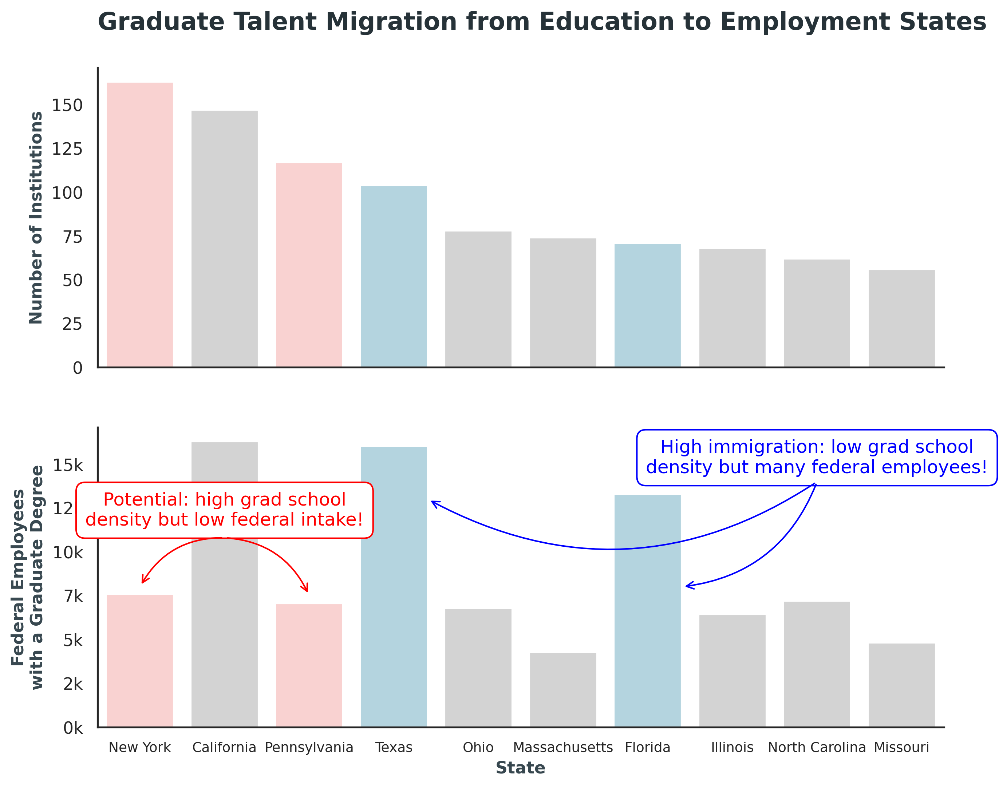

In [25]:
# filter for graduate-granting institutions
grad_scorecard = scorecard_df[scorecard_df['PREDDEG'] == 3]

# count the number of those institutions per state
grad_inst_counts = grad_scorecard.groupby('STABBR')['INSTNM'].count().reset_index()
grad_inst_counts.rename(columns={'STABBR': 'state', 'INSTNM': 'num_grad_institutions'}, inplace=True)

# define graduate level degrees we care about
advanced_degrees = [
    "MASTER'S DEGREE", 
    "POST-BACHELOR'S", 
    "DOCTORATE DEGREE", 
    "POST-DOCTORATE", 
    "POST-MASTER'S"
]

# filter and then count by state
grad_emp_by_state = (
    opm_df[opm_df['education_level'].isin(advanced_degrees)]
    .groupby('duty_station_state_abbr')
    .size()
    .reset_index(name='grad_employee_count')
)
grad_emp_by_state.rename(columns={'duty_station_state_abbr': 'state'}, inplace=True)

# merge on state column
pipeline_df = pd.merge(grad_inst_counts, grad_emp_by_state, on="state")

# sort by institution numbers
pipeline_df = pipeline_df.sort_values(by='num_grad_institutions', ascending=False).head(10)

state_mapping = {
    'NY': 'New York',
    'CA': 'California',
    'PA': 'Pennsylvania',
    'TX': 'Texas',
    'OH': 'Ohio',
    'MA': 'Massachusetts',
    'FL': 'Florida',
    'IL': 'Illinois',
    'NC': 'North Carolina',
    'MO': 'Missouri'
}
# map full names for the chart axes labels
pipeline_df['state_full_name'] = pipeline_df['state'].map(state_mapping)
# reshape
plot_data = pipeline_df.melt(id_vars='state_full_name', var_name='metric', value_name='value')

# custom bar colors
colors = []
for state in pipeline_df['state_full_name']:
    if state in ["New York", "Pennsylvania"]:
        colors.append("#FFCCCB")  # red
    elif state in ["Texas", "Florida"]:
        colors.append("#ADD8E6")  # blue
    else:
        colors.append("#D3D3D3")  # grey

# set up subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# top plot: graduate institutions
sns.barplot(data=pipeline_df, x='state_full_name', y='num_grad_institutions', ax=ax1, palette=colors, hue='state_full_name', legend=False)
ax1.set_title("Graduate Talent Migration from Education to Employment States", loc='left',
             fontsize=16, fontweight='bold', color='#263238', pad=25)
ax1.set_ylabel("Number of Institutions", fontsize=11, fontweight='bold', color='#37474F')

# bottom plot: employees
sns.barplot(data=pipeline_df, x='state_full_name', y='grad_employee_count', ax=ax2, palette=colors, hue='state_full_name', legend=False)
ax2.set_ylabel("Federal Employees\nwith a Graduate Degree", fontsize=11, fontweight='bold', color='#37474F')
ax2.set_xlabel("State", fontsize=11, fontweight='bold', color='#37474F')
# format employees in thousands
ax2.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{int(x/1000)}k'))
ax2.tick_params(axis='x', labelsize=9)

# ANNOTATIONS
# red box for missing opportunities
ax2.annotate("Potential: high grad school\ndensity but low federal intake!", 
             xy=(1, 11500), xytext=(1, 11500),
             ha="center", color="red",
             bbox=dict(boxstyle="round,pad=0.5", fc="white", ec="red"),
             arrowprops=dict(arrowstyle="-", color="red"))
# line to NY
ax2.annotate("", xy=(0, 8000), xytext=(1, 10800),
             arrowprops=dict(arrowstyle="->", color="red", 
                             connectionstyle="arc3,rad=0.3"))
# line to PA
ax2.annotate("", xy=(2, 7500), xytext=(1, 10800),
             arrowprops=dict(arrowstyle="->", color="red", 
                             connectionstyle="arc3,rad=-0.3"))
# blue box for high immigration (lots of people must move here)
ax2.annotate("High immigration: low grad school\ndensity but many federal employees!", 
             xy=(8, 14000), xytext=(8, 14500),
             ha="center", color="blue",
             bbox=dict(boxstyle="round,pad=0.5", fc="white", ec="blue"),
             arrowprops=dict(arrowstyle="-", color="blue"))
# line to TX
ax2.annotate("", xy=(3.4, 13000), xytext=(8, 14000),
             arrowprops=dict(arrowstyle="->", color="blue", connectionstyle="arc3,rad=-0.3"))
# line to FL
ax2.annotate("", xy=(6.4, 8000), xytext=(8, 14000),
             arrowprops=dict(arrowstyle="->", color="blue", connectionstyle="arc3,rad=-0.3"))
sns.despine()

# save and display!
image_name = "graduate_talent_migration_from_education_to_employment_states"
plt.savefig(f"output/{image_name}.png", dpi=300, bbox_inches='tight')
plt.close()
display(Image(filename=f"output/{image_name}.png"))